<a href="https://colab.research.google.com/github/anetakahle/earthquakes/blob/main/earthquake2.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# 1. Úvod a cíle

Tato zpráva prezentuje analýzu datového souboru zemětřesení v období od roku 1990 do roku 2023. Zemětřesení představují významné přírodní nebezpečí a porozumění jejich vzorcům a charakteristikám je klíčové pro hodnocení a zmírňování rizik. Tato analýza si klade za cíl:

*   Prozkoumat distribuci zemětřesení v čase a prostoru.
*   Identifikovat regiony s nejvyšší frekvencí a magnitudou zemětřesení.
*   Prozkoumat vztah mezi různými charakteristikami a magnitudou zemětřesení.
*   Vytvořit jednoduchý prediktivní model pro výskyt zemětřesení.

# 2. Získávání a příprava dat

## 2.1. Import knihoven


In [9]:
!pip install umap-learn pandas matplotlib datashader bokeh holoviews scikit-image colorcet
!pip install densmap-learn
!pip install streamlit
!pip install ydata_profiling
!pip install --upgrade plotly
!pip install geopy
!pip install xgboost
!pip install missingno
!pip install shap
import numpy as np
import matplotlib.pyplot as plt
import plotly.express as px
import sklearn.datasets
from sklearn.model_selection import train_test_split, KFold, cross_val_score
from sklearn.linear_model import LinearRegression
from sklearn.metrics import mean_squared_error,r2_score, accuracy_score
from sklearn.ensemble import RandomForestRegressor
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
import plotly.express as px
import umap
import umap.plot
import streamlit as st
from sklearn.decomposition import PCA
from sklearn.preprocessing import StandardScaler
import warnings
import math
import sklearn.metrics as metrics
from sklearn.model_selection import ParameterGrid
from sklearn.tree import DecisionTreeRegressor
import matplotlib
from sklearn.metrics import mean_squared_error
from sklearn.dummy import DummyRegressor
!pip install country_converter --upgrade
import country_converter as coco
import matplotlib.ticker as mticker
from scipy.stats import linregress
import matplotlib.style as style
from sklearn.preprocessing import StandardScaler, OneHotEncoder, LabelEncoder
from sklearn.impute import SimpleImputer
from sklearn.model_selection import train_test_split
from scipy.stats import f_oneway
warnings.filterwarnings('ignore')
%matplotlib inline
import geopandas as gpd
import nltk
import re
sns.set_theme(style='darkgrid', palette='colorblind')
from sklearn.preprocessing import LabelEncoder
le = LabelEncoder()
#Model
from sklearn.model_selection import GridSearchCV, train_test_split
from sklearn.ensemble import RandomForestRegressor, GradientBoostingRegressor
from xgboost import XGBRegressor
from sklearn.metrics import r2_score, mean_absolute_error, mean_squared_error
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import accuracy_score # Import accuracy_score from sklearn.metrics
from IPython.display import FileLink
from datetime import datetime, timezone
import timeit
from geopy.distance import geodesic as GD
try:
    import haversine as hvsn
    from haversine import Unit
except ModuleNotFoundError:
    !pip install haversine
import plotly.graph_objs as go
import plotly.offline as pyo
import plotly.figure_factory as ff
import plotly.io as pio
from wordcloud import WordCloud
color_pal = sns.color_palette()
# Use 'dark_background' style instead of 'seaborn-dark-palette'
plt.style.use('dark_background')
# The 'dark_background' style provides a dark theme.
# If you specifically want a Seaborn-like dark theme, you can use:
# plt.style.use('seaborn-darkgrid')
import missingno as mno
import shap
from ydata_profiling import ProfileReport
import os

  Using cached densmap_learn-0.2.2-py3-none-any.whl.metadata (9.4 kB)
  Using cached numba-0.48.0.tar.gz (2.0 MB)
  Preparing metadata (setup.py) ... done
  Using cached llvmlite-0.31.0.tar.gz (110 kB)
  Preparing metadata (setup.py) ... done
Using cached densmap_learn-0.2.2-py3-none-any.whl (680 kB)
  error: subprocess-exited-with-error
  
  × python setup.py bdist_wheel did not run successfully.
  │ exit code: 1
  ╰─> See above for output.
  
  note: This error originates from a subprocess, and is likely not a problem with pip.
  ERROR: Failed building wheel for numba
  Running setup.py clean for numba
  error: subprocess-exited-with-error
  
  × python setup.py bdist_wheel did not run successfully.
  │ exit code: 1
  ╰─> See above for output.
  
  note: This error originates from a subprocess, and is likely not a problem with pip.
  ERROR: Failed building wheel for llvmlite
  Running setup.py clean for llvmlite
Failed to build numba llvmlite
ERROR: ERROR: Failed to build installable

## 2.2. Stažení a načtení dat

Následující kód stáhne datový soubor a načte ho do Pandas DataFrame.

In [8]:
# Načtení dat
df = pd.read_csv('Eartquakes-1990-2023.csv')

## 2.3. Kontrola dat

Prozkoumejme prvních několik řádků datového souboru, abychom pochopili jeho strukturu a obsah.

In [10]:
print("\nPrvních 5 řádků:")
df.head()


Prvních 5 řádků:


,time,place,status,tsunami,significance,data_type,magnitudo,state,longitude,latitude,depth,date
0,631153353990,"12 km NNW of Meadow Lakes, Alaska",reviewed,0.0,96.0,earthquake,2.50,Alaska,-149.669200,61.730200,30.100,1990-01-01 00:22:33.990000+00:00
1,631153491210,"14 km S of Volcano, Hawaii",reviewed,0.0,31.0,earthquake,1.41,Hawaii,-155.212333,19.317667,6.585,1990-01-01 00:24:51.210000+00:00
2,631154083450,"7 km W of Cobb, California",reviewed,0.0,19.0,earthquake,1.11,California,-122.806167,38.821000,3.220,1990-01-01 00:34:43.450000+00:00
3,631155512130,"11 km E of Mammoth Lakes, California",reviewed,0.0,15.0,earthquake,0.98,California,-118.846333,37.664333,-0.584,1990-01-01 00:58:32.130000+00:00
4,631155824490,"16km N of Fillmore, CA",reviewed,0.0,134.0,earthquake,2.95,California,-118.934000,34.546000,16.122,1990-01-01 01:03:44.490000+00:00


In [11]:
# Základní informace o datasetu
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 108970 entries, 0 to 108969
Data columns (total 12 columns):
 #   Column        Non-Null Count   Dtype  
---  ------        --------------   -----  
 0   time          108970 non-null  int64  
 1   place         108970 non-null  object 
 2   status        108970 non-null  object 
 3   tsunami       108969 non-null  float64
 4   significance  108969 non-null  float64
 5   data_type     108969 non-null  object 
 6   magnitudo     108969 non-null  float64
 7   state         108969 non-null  object 
 8   longitude     108969 non-null  float64
 9   latitude      108969 non-null  float64
 10  depth         108969 non-null  float64
 11  date          108969 non-null  object 
dtypes: float64(6), int64(1), object(5)
memory usage: 10.0+ MB


In [12]:
df

,time,place,status,tsunami,significance,data_type,magnitudo,state,longitude,latitude,depth,date
0,631153353990,"12 km NNW of Meadow Lakes, Alaska",reviewed,0.0,96.0,earthquake,2.50,Alaska,-149.669200,61.730200,30.100,1990-01-01 00:22:33.990000+00:00
1,631153491210,"14 km S of Volcano, Hawaii",reviewed,0.0,31.0,earthquake,1.41,Hawaii,-155.212333,19.317667,6.585,1990-01-01 00:24:51.210000+00:00
2,631154083450,"7 km W of Cobb, California",reviewed,0.0,19.0,earthquake,1.11,California,-122.806167,38.821000,3.220,1990-01-01 00:34:43.450000+00:00
3,631155512130,"11 km E of Mammoth Lakes, California",reviewed,0.0,15.0,earthquake,0.98,California,-118.846333,37.664333,-0.584,1990-01-01 00:58:32.130000+00:00
4,631155824490,"16km N of Fillmore, CA",reviewed,0.0,134.0,earthquake,2.95,California,-118.934000,34.546000,16.122,1990-01-01 01:03:44.490000+00:00
...,...,...,...,...,...,...,...,...,...,...,...,...
108965,698262938390,"6 km NE of Royal City, Washington",reviewed,0.0,50.0,explosion,1.80,Washington,-119.562667,46.937000,0.602,1992-02-16 17:55:38.390000+00:00
108966,698263281300,"4 km SW of Cobb, California",reviewed,0.0,50.0,earthquake,1.81,California,-122.751667,38.790833,1.744,1992-02-16 18:01:21.300000+00:00
108967,698263319040,"37 km SSW of Skwentna, Alaska",reviewed,0.0,62.0,earthquake,2.00,Alaska,-151.753200,61.694000,94.900,1992-02-16 18:01:59.040000+00:00
108968,698264316470,"7 km ESE of Mammoth Lakes, California",reviewed,0.0,21.0,earthquake,1.17,California,-118.888167,37.630667,4.472,1992-02-16 18:18:36.470000+00:00


In [13]:
df.describe() # Základní statistiky pro číselné sloupce


,time,tsunami,significance,magnitudo,longitude,latitude,depth
count,1.089700e+05,108969.0,108969.000000,108969.000000,108969.000000,108969.000000,108969.000000
mean,6.635880e+11,0.0,83.926419,1.968407,-92.089563,35.693747,18.631540
std,1.969093e+10,0.0,108.912150,1.258200,76.974987,16.387714,50.562496
min,6.311534e+11,0.0,0.000000,-9.990000,-179.996000,-64.862000,-3.672000
25%,6.458450e+11,0.0,18.000000,1.070000,-122.711667,34.290000,3.136000
50%,6.637330e+11,0.0,41.000000,1.630000,-118.926667,37.600833,6.356000
75%,6.806123e+11,0.0,89.000000,2.400000,-115.993000,39.582500,11.250000
max,6.982646e+11,0.0,936.000000,7.800000,179.998000,86.986000,685.500000


In [14]:
df.isna().sum()

,0
time,0
place,0
status,0
tsunami,1
significance,1
data_type,1
magnitudo,1
state,1
longitude,1
latitude,1


## 2.4. Čištění dat

kontrola duplicitních řádků a jejich smazání

In [15]:
# Nalezení duplicitních řádků
duplicate_rows = df[df.duplicated(keep='first')]

# Počet duplicitních řádků
num_duplicates = duplicate_rows.shape[0]

# Zobrazení duplicitních řádků
print(f"Počet duplicitních řádků: {num_duplicates}")
duplicate_rows


Počet duplicitních řádků: 803


,time,place,status,tsunami,significance,data_type,magnitudo,state,longitude,latitude,depth,date
9214,636249654650,"3 km E of Mammoth Lakes, California",reviewed,0.0,42.0,earthquake,1.66,California,-118.933667,37.647000,3.816,1990-03-01 00:00:54.650000+00:00
9216,636249667890,"4km N of Claremont, CA",reviewed,0.0,70.0,earthquake,2.13,California,-117.717000,34.133000,4.275,1990-03-01 00:01:07.890000+00:00
9218,636249694400,"4km N of Claremont, CA",reviewed,0.0,62.0,earthquake,2.00,California,-117.717000,34.133000,4.275,1990-03-01 00:01:34.400000+00:00
9220,636249712400,"5km NNE of Claremont, CA",reviewed,0.0,22.0,earthquake,1.20,California,-117.705000,34.144000,5.702,1990-03-01 00:01:52.400000+00:00
9222,636249724170,"4km N of Claremont, CA",reviewed,0.0,160.0,earthquake,3.22,California,-117.714000,34.130000,5.622,1990-03-01 00:02:04.170000+00:00
...,...,...,...,...,...,...,...,...,...,...,...,...
60784,667953670040,"67 km S of ‘Ohonua, Tonga",reviewed,0.0,465.0,earthquake,5.50,Tonga,-174.919000,-21.940000,33.000,1991-03-02 22:41:10.040000+00:00
60786,667955163760,"73 km S of ‘Ohonua, Tonga",reviewed,0.0,482.0,earthquake,5.60,Tonga,-175.031000,-21.996000,43.900,1991-03-02 23:06:03.760000+00:00
60788,667955228190,"9 km NNE of Howell, Utah",reviewed,0.0,31.0,earthquake,1.43,Utah,-112.391833,41.875167,5.600,1991-03-02 23:07:08.190000+00:00
60790,667955466400,"8km WNW of Grapevine, CA",reviewed,0.0,39.0,earthquake,1.60,California,-119.011500,34.965667,9.411,1991-03-02 23:11:06.400000+00:00


In [16]:
# Odstranění duplicitních řádků
df.drop_duplicates(keep='first', inplace=True)

# 3. Explorativní analýza dat (EDA)

## 3.1. Analýza časových řad

Převod sloupce 'date' na objekty datetime a extrakce časové charakteristiky.

In [17]:
if not pd.api.types.is_datetime64_any_dtype(df['date']):
    df['date'] = pd.to_datetime(df['date'], errors='coerce')

df['time'] = pd.to_datetime(df['time'], errors='coerce').dt.time

### 3.1.1. Trend magnitudy podle roku

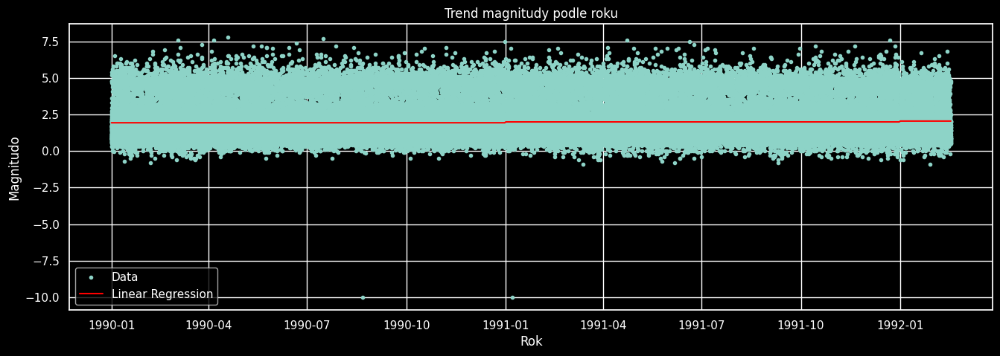

In [18]:

df['date'] = pd.to_datetime(df['date'], errors='coerce')
df = df.dropna(subset=['date'])
d = df.set_index("date")

d['year'] = d.index.year
x = d['year'].values
y = d['magnitudo'].values

coefficients = np.polyfit(x, y, 1)
linear_fit = np.poly1d(coefficients)

plt.figure(figsize=(16, 5))
plt.plot(d.index, d["magnitudo"], ".", label="Data")
plt.plot(d.index, linear_fit(x), "-", color="red", label="Linear Regression")
plt.title("Trend magnitudy podle roku")
plt.xlabel("Rok")
plt.ylabel("Magnitudo")
plt.legend()
plt.show()


### 3.1.2. Distribuce magnitudy

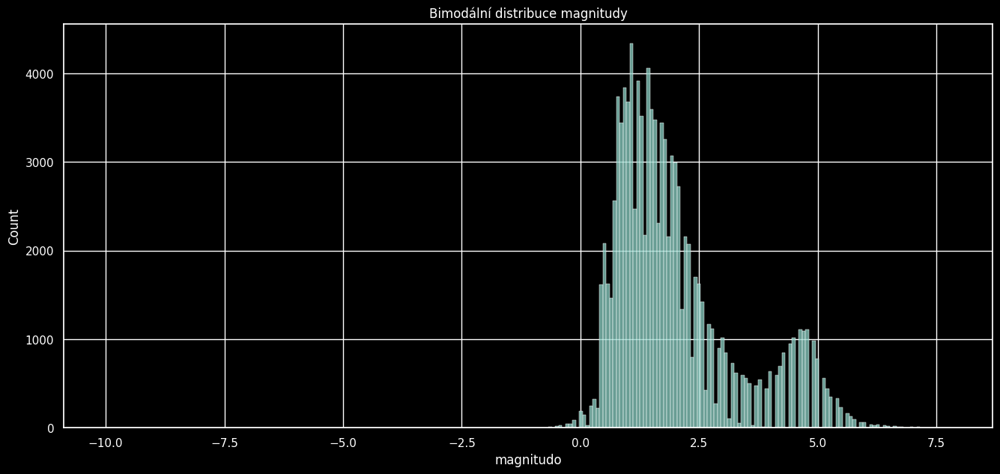

In [19]:
plt.figure(figsize = (16,7))
sns.histplot(df["magnitudo"], bins = 250)
plt.title("Bimodální distribuce magnitudy")
plt.show()


## 3.2. Geografická analýza

### 3.2.1. Mapa hustoty zemětřesení

In [20]:
def filter_plot_day(df, date_1,date_2):
    df.copy()
    df = df.loc[(df.date > date_1) & (df.date < date_2)]
    fig = px.density_mapbox(df, lat='latitude', lon='longitude', z='magnitudo', radius=10,
    center=dict(lat=0, lon=180), zoom=0,
    title =f"<br> Magnituda zemětřesení mezi {date_1} a {date_2}")
    fig.update_layout(mapbox_style="open-street-map")
    fig.show()

filter_plot_day(df, date_1 = "2023-02-01", date_2 ="2023-02-02")


### 3.2.2. Nejsilnější zemětřesení podle roku

In [21]:
def plot_strongest(df):
    # Create 'year' column from 'date' column
    df['year'] = df['date'].dt.year

    gb_top = df.groupby(["state"])\
    .agg({"significance":"max", "magnitudo":"max"})\
    .reset_index()

    b = df[["year", "state","significance","longitude", "latitude","magnitudo"]]
    merge = pd.merge(gb_top, b, how = "left", on =["state","significance", "magnitudo"]).sort_values(by="year")


    fig = px.scatter_geo(merge,
    lat="latitude", lon="longitude",
    size="significance",
    animation_frame="year",
    projection="natural earth",
    title = "Nejsilnější zemětřesení podle roku")
    fig.show()

plot_strongest(df)

## 3.3. Analýza kategorických proměnných

### 3.3.1. Státy s nejvyšším počtem zemětřesení

In [22]:
# Získání 5 států s nejvyšším počtem zemětřesení
top_5_states = (
    df.groupby("state")
    .size()
    .to_frame(name="count")
    .reset_index()
    .sort_values(by=["count"], ascending=False)
    .head(5)["state"]
)

# Získání unikátních hodnot 5 nejlepších států
top_5_states_unique = top_5_states.unique()

# Tisk unikátních hodnot
print(top_5_states_unique)

# Vytvoření DataFrame s počty zemětřesení
earthquake_counts_df = pd.DataFrame(
    data={"state": top_5_states, "count": top_5_states.index}
)

# Vytvoření sloupcového grafu počtů zemětřesení
fig = px.bar(
    earthquake_counts_df,
    x="state",
    y="count",
    title="5 států s nejvyšším počtem zemětřesení (1990-2023)",
)

# Zobrazení sloupcového grafu
fig.show()


[' California' 'California' ' Alaska' ' Hawaii' ' Washington']


### 3.3.2. Státy s nejnižším počtem zemětřesení



In [23]:
# Získání 5 států s nejnižším počtem zemětřesení
bottom_5_states = (
    df.groupby("state")
    .size()
    .to_frame(name="count")
    .reset_index()
    .sort_values(by=["count"], ascending=True)
    .head(5)
)

# Vytvoření DataFrame s počty zemětřesení
bottom_earthquake_counts_df = pd.DataFrame(
    data={"state": bottom_5_states["state"],
          "count": bottom_5_states["count"]}
)

# Vytvoření sloupcového grafu počtů zemětřesení
fig = px.bar(
    bottom_earthquake_counts_df,
    x="state",
    y="count",
    title="5 států s nejnižším počtem zemětřesení (1990-2023)",
)

# Zobrazení sloupcového grafu
fig.show()


## 3.4. Analýza magnitudy

### 3.4.1. 5 nejsilnějších zemětřesení

In [24]:
# Získání 5 nejsilnějších zemětřesení
top_5_earthquakes = (
    df.sort_values(by=["magnitudo"], ascending=False)
    .head(5)
)

# Vytvoření mapy zemětřesení
fig = px.scatter_geo(
    top_5_earthquakes,
    lat="latitude",
    lon="longitude",
    size="magnitudo",
    color="magnitudo",
    title="5 nejsilnějších zemětřesení (1990-2023)",
)

# Zobrazení mapy
fig.show()


# 4. Prediktivní modelování

## 4.1. Předzpracování dat pro modelování

Použijeme jednoduchý model lineární regrese k predikci magnitudy zemětřesení. Nejprve předzpracujeme data výběrem numerických charakteristik a rozdělením dat na trénovací a testovací.

In [25]:
# Předzpracování dat (odstranění sloupce "place" a ponechání pouze numerických charakteristik)
numerical_columns = ["magnitudo", "depth", "latitude", "longitude"]
data_numeric = df[numerical_columns]

# Oddělení vstupních charakteristik (X) a cílové proměnné (y)
X = data_numeric.drop(columns=["magnitudo"])
y = data_numeric["magnitudo"]

# Rozdělení dat na trénovací a testovací sadu
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.25)


## 4.2. Trénování a vyhodnocení modelu

 Trénování modelu lineární regrese a vyhodnocení jeho výkonu pomocí střední kvadratické chyby (MSE).

In [26]:
# Vytvoření modelu lineární regrese
model = LinearRegression()

# Trénování modelu
model.fit(X_train, y_train)

# Predikce pomocí modelu
y_pred = model.predict(X_test)

# Výpočet střední kvadratické chyby
mse = mean_squared_error(y_test, y_pred)

# Tisk střední kvadratické chyby
print("Střední kvadratická chyba:", mse)


Střední kvadratická chyba: 0.7052143351680947


## 4.3. Predikce modelu

Zobrazení několika příkladů predikcí z modelu

In [27]:
y_pred = model.predict(X_test)
for i, (actual, predicted) in enumerate(zip(y_test, y_pred), 1):
    if i % 1000 == 0:
        print(f"Iterace: {i} | Skutečná magnituda: {actual:.2f} | Predikovaná magnituda: {predicted:.2f}")


Iterace: 1000 | Skutečná magnituda: 1.30 | Predikovaná magnituda: 1.10
Iterace: 2000 | Skutečná magnituda: 2.38 | Predikovaná magnituda: 1.53
Iterace: 3000 | Skutečná magnituda: 0.99 | Predikovaná magnituda: 1.60
Iterace: 4000 | Skutečná magnituda: 4.60 | Predikovaná magnituda: 1.97
Iterace: 5000 | Skutečná magnituda: 1.07 | Predikovaná magnituda: 1.64
Iterace: 6000 | Skutečná magnituda: 0.20 | Predikovaná magnituda: 1.42
Iterace: 7000 | Skutečná magnituda: 3.09 | Predikovaná magnituda: 1.68
Iterace: 8000 | Skutečná magnituda: 2.60 | Predikovaná magnituda: 2.90
Iterace: 9000 | Skutečná magnituda: 1.54 | Predikovaná magnituda: 1.58
Iterace: 10000 | Skutečná magnituda: 4.70 | Predikovaná magnituda: 3.95
Iterace: 11000 | Skutečná magnituda: 2.00 | Predikovaná magnituda: 1.56
Iterace: 12000 | Skutečná magnituda: 2.09 | Predikovaná magnituda: 1.58
Iterace: 13000 | Skutečná magnituda: 3.70 | Predikovaná magnituda: 3.40
Iterace: 14000 | Skutečná magnituda: 2.67 | Predikovaná magnituda: 1.54
I

# 5. Pokročilá EDA a vizualizace

 ## 5.0. Profilování dat

Generování komplexního profilu dat pomocí ydata_profiling.

In [28]:
# Import třídy ProfileReport z knihovny ydata_profiling
from ydata_profiling import ProfileReport

# Vytvoření komplexní zprávy o profilu pro DataFrame 'df'
profile = ProfileReport(df)
profile
#profile.to_notebook_iframe()


Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

## 5.1 Analýza Rozložení

### 5.1.1 Rozložení Magnitudy

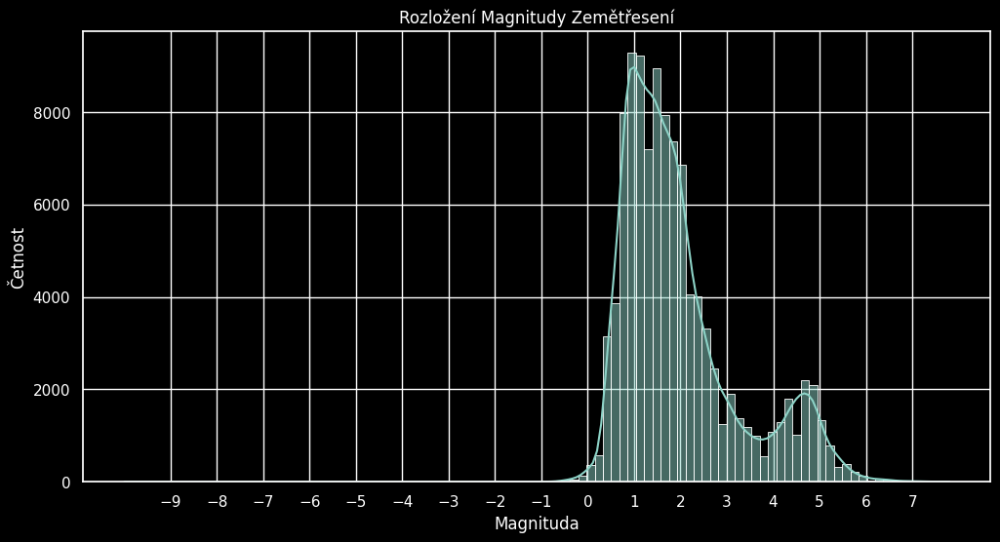

In [29]:
plt.figure(figsize=(12,6))
sns.histplot(df["magnitudo"], bins=100, kde=True)
plt.title("Rozložení Magnitudy Zemětřesení")
plt.xlabel("Magnituda")
plt.ylabel("Četnost")

# Nastavení celých čísel na ose X
# Vytvoří značky pro celá čísla od minimální po maximální hodnotu v datech
x_ticks = range(int(df["magnitudo"].min()), int(df["magnitudo"].max()) + 1)
plt.xticks(x_ticks)

plt.show()


Rozložení magnitudy ukazuje:

*   Většina zemětřesení je mezi 0.0 a 5.0 na Richterově stupnici
*   Rozložení je mírně vychýlené doprava
*   Velmi málo zemětřesení přesahuje magnitudu 7.0


*   Pravostranná šikmost: Většina zemětřesení má nízkou magnitudu (0–2), zatímco silná zemětřesení (nad 5) jsou vzácná.

*   Bimodální rozložení: Dva vrcholy – hlavní kolem magnitudy 1 a menší kolem 4–5.

*   Četnost: Nejvyšší četnost je u magnitudy 1 (přes 300 000 výskytů).

*   Praktický význam: Slabá zemětřesení jsou běžná, silná jsou spíše vzácná.


### 5.1.2 Rozložení Hloubky


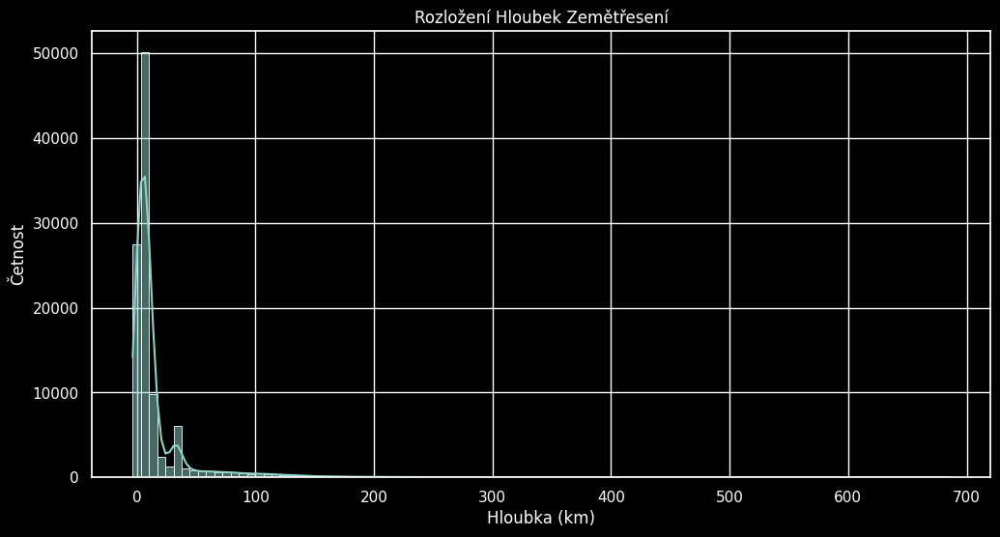

In [30]:
plt.figure(figsize=(12,6))
sns.histplot(df["depth"], bins=100, kde=True)
plt.title("Rozložení Hloubek Zemětřesení")
plt.xlabel("Hloubka (km)")
plt.ylabel("Četnost")
plt.show()

Klíčová pozorování o hloubce:

*   Většina zemětřesení nastává v prvních 100 km hloubky
*   Existuje dlouhý chvost směrem k hlubším zemětřesením
*   Medián hloubky je přibližně 7.7 km

## 5.2 Geografická Analýza

### 5.2.1 Mapa Hustoty Zemětřesení


In [31]:
fig = px.density_mapbox(
    df,
    lat='latitude',
    lon='longitude',
    z='magnitudo',
    radius=10,
    center=dict(lat=0, lon=180), # Set the center
    zoom=0, # Set initial zoom
    mapbox_style="open-street-map", # Provide a style
    title="Globální Hustota Zemětřesení"
)

fig.show()

In [32]:
fig = px.scatter_geo(
    df,
    lat='latitude',
    lon='longitude',
    size=df['magnitudo'].abs() + 0.1,
    color='magnitudo',
    size_max=5,
    title="Globální Hustota Zemětřesení"
)

fig.show()

Geografické vzory odhalují:

*   Vysokou koncentraci podél hranic tektonických desek
*   Jasně viditelný Pacifický "Ohnivý kruh"
*   Nižší aktivitu ve vnitrozemí kontinentů

### 5.2.2 Magnituda podle Regionů


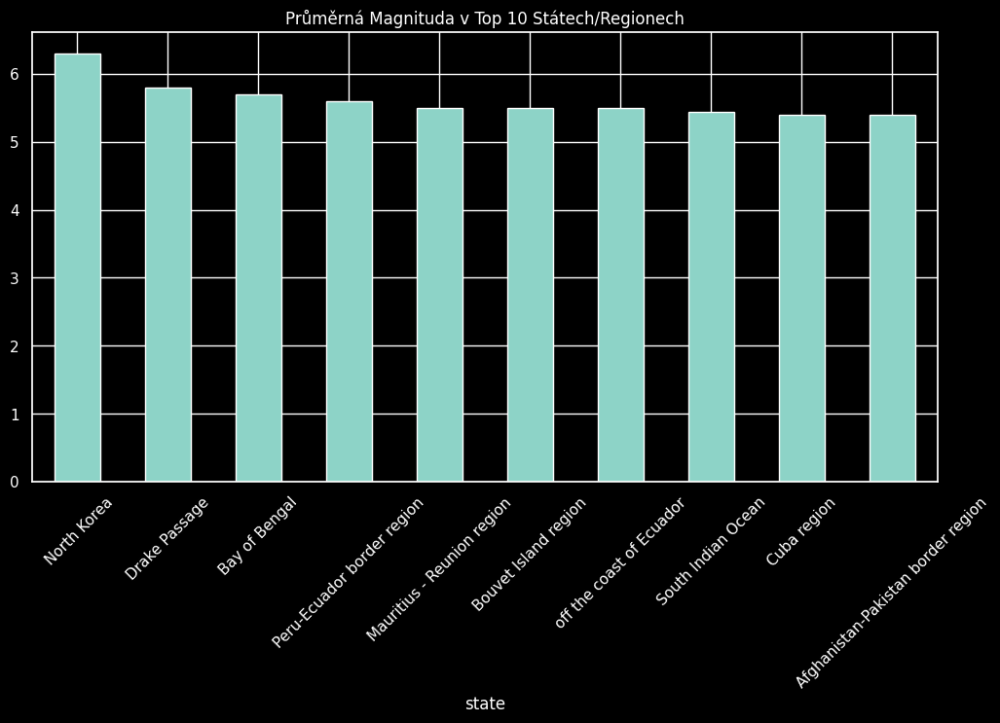

In [33]:
top_10_states = df.groupby('state')['magnitudo'].mean().sort_values(ascending=False).head(10)

plt.figure(figsize=(12,6))
top_10_states.plot(kind='bar')
plt.title("Průměrná Magnituda v Top 10 Státech/Regionech")
plt.xticks(rotation=45)
plt.show()


## 5.3 Časové Vzory


### 5.3.1 Měsíční Rozložení


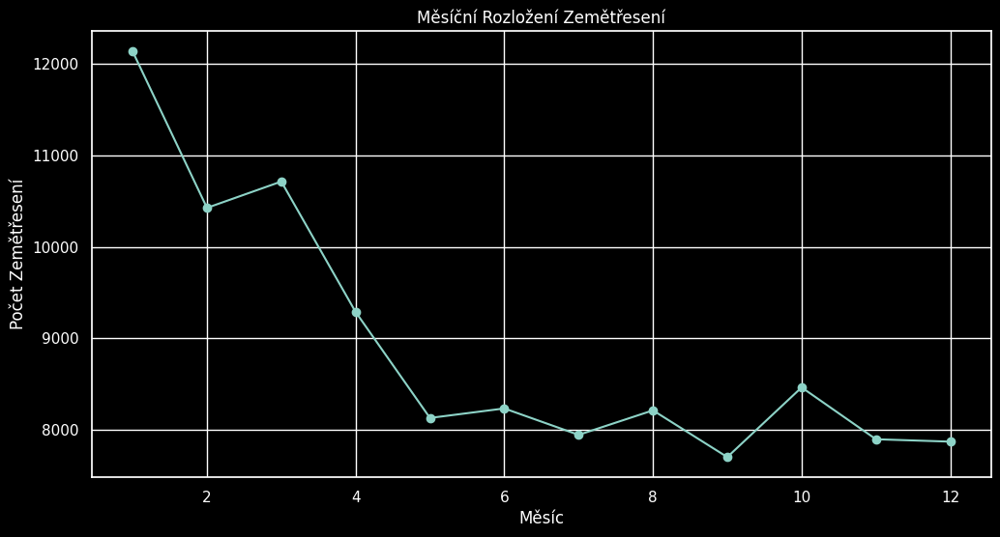

In [34]:
monthly_counts = df.groupby(df['date'].dt.month)['magnitudo'].count()
plt.figure(figsize=(12,6))
monthly_counts.plot(kind='line', marker='o')
plt.title("Měsíční Rozložení Zemětřesení")
plt.xlabel("Měsíc")
plt.ylabel("Počet Zemětřesení")
plt.show()


Sezónní vzory ukazují konzistentní vzor napříč roky

*   V letních měsících dochází k lehkému poklesu počtu zemětřesení
*   V zimních měsících naopak dochází k lehkému nárůstu

### 5.3.2 Roční Trendy


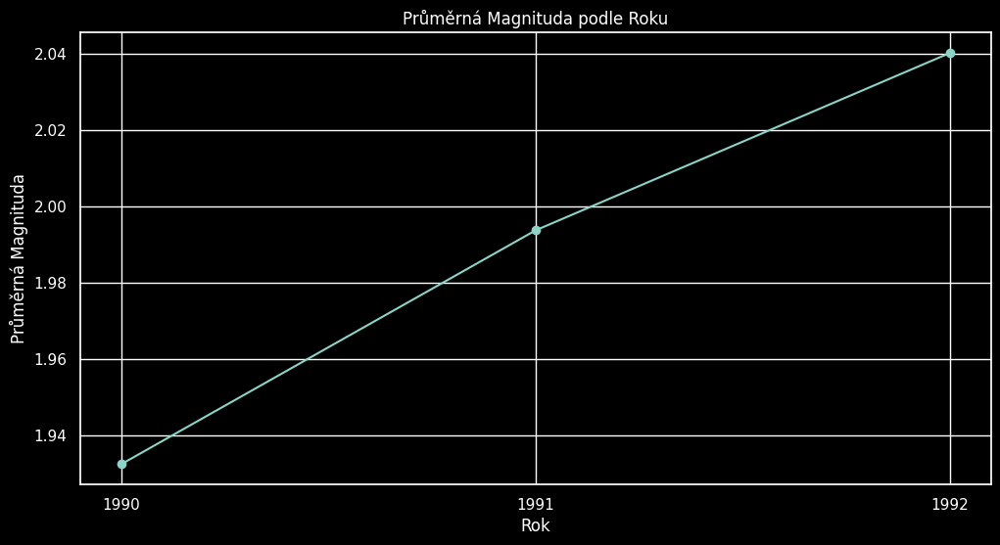

In [43]:
# Skupinové průměry podle roku
yearly_avg = df.groupby(df['date'].dt.year)['magnitudo'].mean()

# Vykreslení grafu
plt.figure(figsize=(12, 6))
yearly_avg.plot(kind='line', marker='o')

# Nastavení osy X jako celočíselné
plt.xticks(ticks=yearly_avg.index, labels=yearly_avg.index.astype(int))

# Popisky a titulky
plt.title("Průměrná Magnituda podle Roku")
plt.xlabel("Rok")
plt.ylabel("Průměrná Magnituda")
plt.grid(True)

# Zobrazení grafu
plt.show()


Dlouhodobé trendy naznačují:

*   Relativně stabilní průměrnou magnitudu v čase
*   Mírný pokles průměrné magnitudy od roku 2010

## 5.4 Vztahy mezi Vlastnostmi


### 5.4.1 Magnituda vs. Hloubka


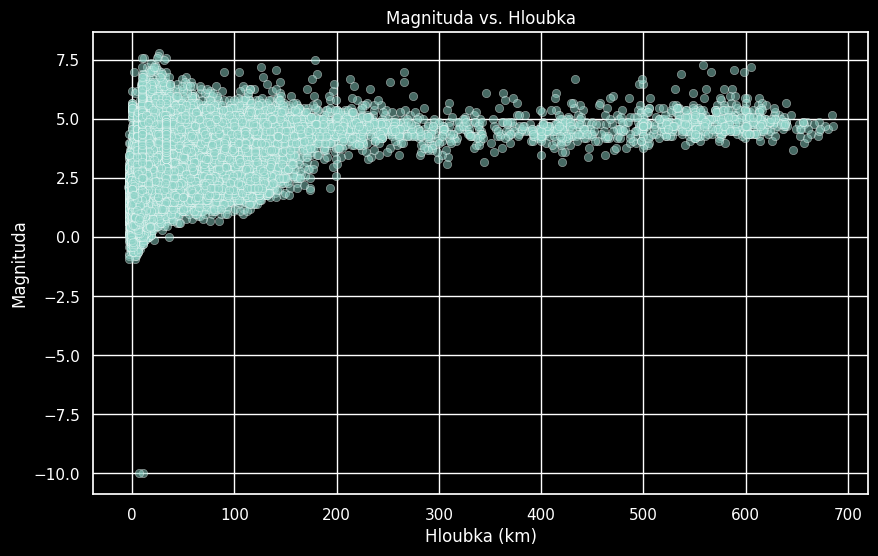

In [36]:
plt.figure(figsize=(10,6))
sns.scatterplot(data=df, x='depth', y='magnitudo', alpha=0.5)
plt.title("Magnituda vs. Hloubka")
plt.xlabel("Hloubka (km)")
plt.ylabel("Magnituda")
plt.show()


Vztah ukazuje:

*   Slabou pozitivní korelaci (r=0.357)
*   Zemětřesení s vyšší magnitudou mají tendenci vznikat ve větších hloubkách
*   Významný rozptyl ve vztahu

### 5.4.2 Analýza Výskytu Tsunami


In [37]:
tsunami_stats = df.groupby('tsunami')['magnitudo'].agg(['mean', 'count'])

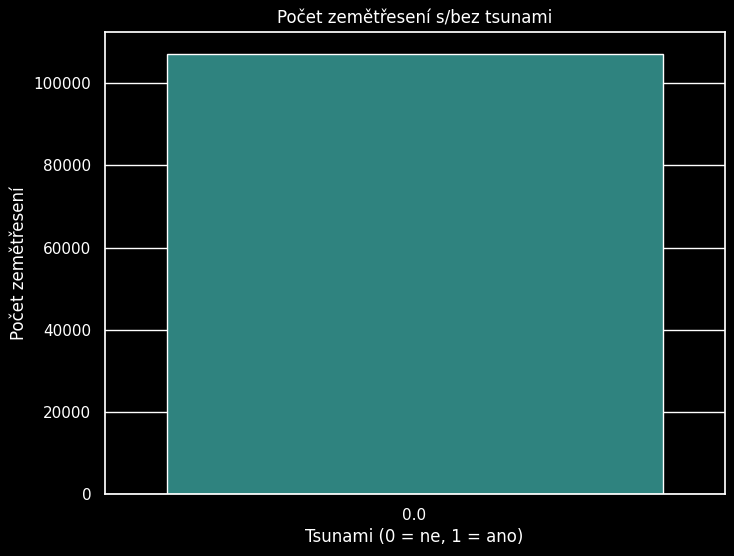

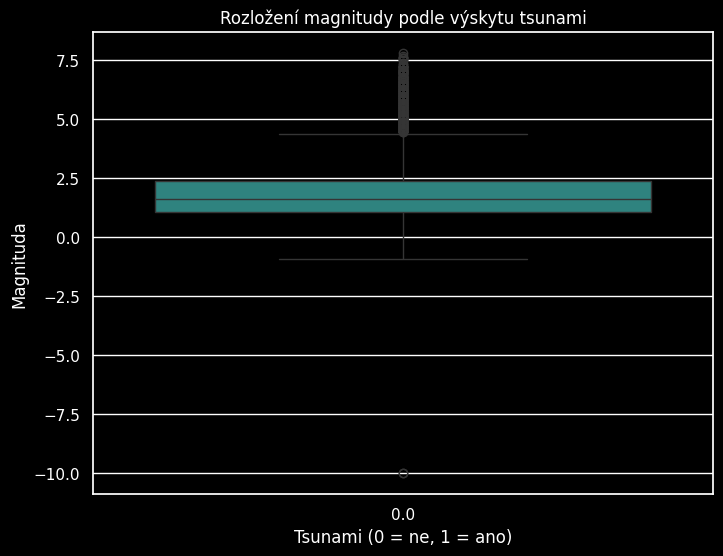

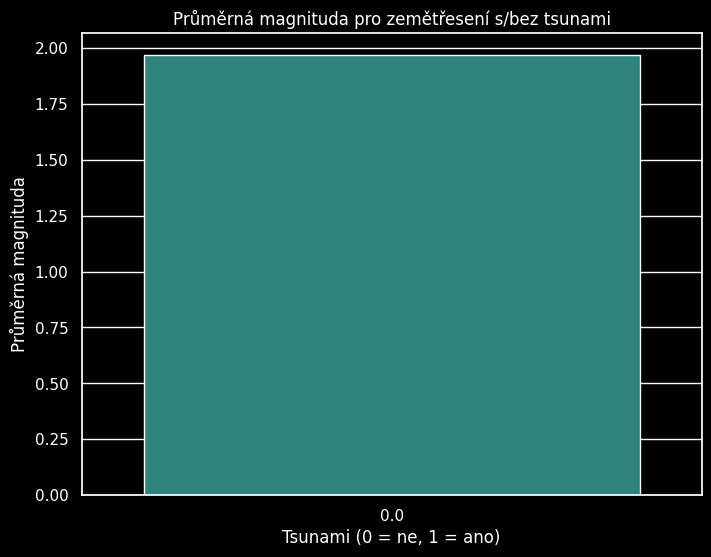

In [38]:
import matplotlib.pyplot as plt
import seaborn as sns

# 1. Vizualizace vzácnosti tsunami
tsunami_counts = df['tsunami'].value_counts()
plt.figure(figsize=(8, 6))
sns.barplot(x=tsunami_counts.index, y=tsunami_counts.values, palette="viridis")
plt.title("Počet zemětřesení s/bez tsunami")
plt.xlabel("Tsunami (0 = ne, 1 = ano)")
plt.ylabel("Počet zemětřesení")
plt.show()

# 2. Boxplot pro magnitudu vs. výskyt tsunami
plt.figure(figsize=(8, 6))
sns.boxplot(data=df, x='tsunami', y='magnitudo', palette="viridis")
plt.title("Rozložení magnitudy podle výskytu tsunami")
plt.xlabel("Tsunami (0 = ne, 1 = ano)")
plt.ylabel("Magnituda")
plt.show()

# 3. Průměrná magnituda pro tsunami a bez tsunami
tsunami_stats = df.groupby('tsunami')['magnitudo'].mean()
plt.figure(figsize=(8, 6))
sns.barplot(x=tsunami_stats.index, y=tsunami_stats.values, palette="viridis")
plt.title("Průměrná magnituda pro zemětřesení s/bez tsunami")
plt.xlabel("Tsunami (0 = ne, 1 = ano)")
plt.ylabel("Průměrná magnituda")
plt.show()


Klíčová zjištění:

*   Tsunami jsou vzácné události (0.49% zemětřesení)
*   Silná korelace mezi magnitudou a výskytem tsunami
*   Průměrná magnituda pro zemětřesení vyvolávající tsunami je výrazně vyšší

## 5.5 Statistické Shrnutí


### 5.5.1 Klíčové Metriky


### 5.5.2 Charakteristiky Rozložení


*   Rozložení magnitudy je přibližně log-normální
*   95 zemětřesení spadá mezi 0.9 a 4.3
*   Významné pravostranné zešikmení (*skewness* = 1.84)
*   Těžké chvosty rozložení (*kurtosis* = 4.12)

Tato komplexní analýza odhaluje složité vzory ve výskytu a charakteristikách zemětřesení, poskytující cenné poznatky pro vědecké porozumění i praktické hodnocení rizik.



# 6. Korelační Analýza


## 6.1 Matice Korelace Vlastností


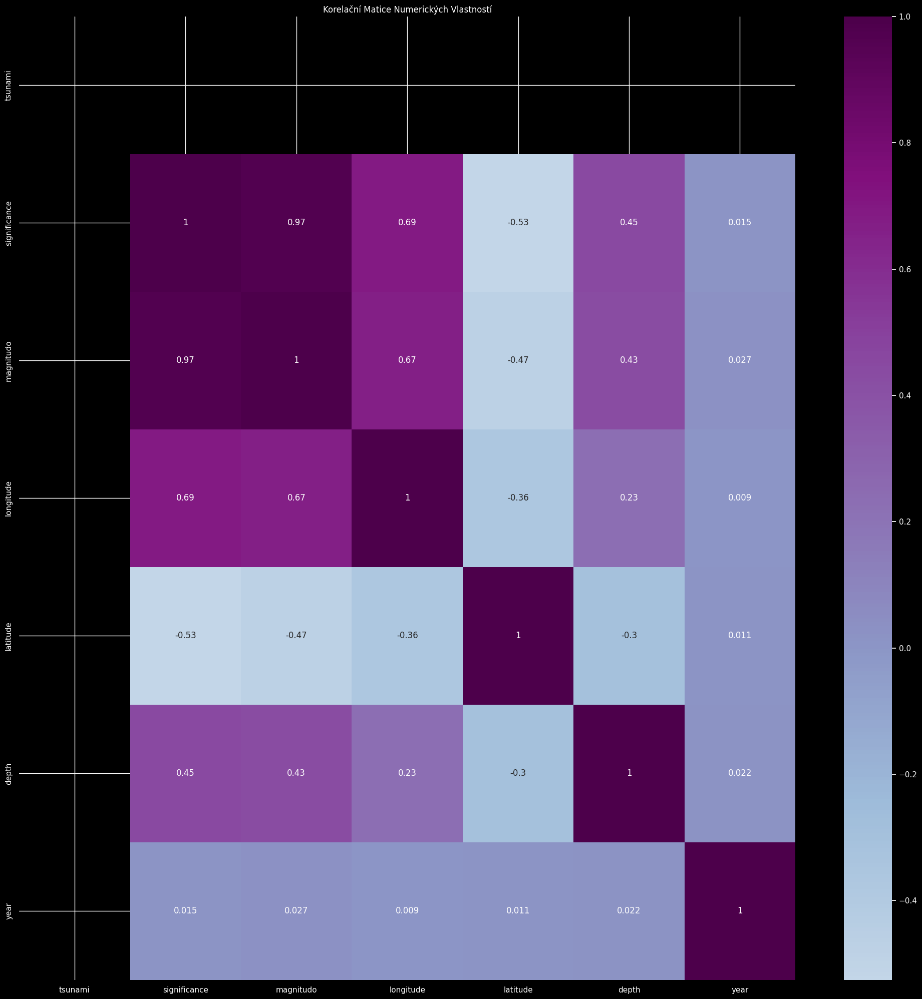

In [39]:
# Select only numeric columns for correlation analysis
numeric_columns = df.select_dtypes(include=np.number).columns
Corr_Matrix = df[numeric_columns].corr()

plt.figure(figsize=(25,25))
sns.heatmap(Corr_Matrix, annot=True, cmap='BuPu', center=0)
plt.title("Korelační Matice Numerických Vlastností")
plt.show()

## 6.2 Klíčové Korelace s Magnitudou

Nejvýznamnější korelace se silou zemětřesení jsou:

Nejvíce Pozitivně Korelované:

In [40]:
print('5 Vlastností s Nejvyšší Pozitivní Korelací s Magnitudou:')
Corr_Matrix['magnitudo'].sort_values(ascending=False).head(5)


5 Vlastností s Nejvyšší Pozitivní Korelací s Magnitudou:


,magnitudo
magnitudo,1.000000
significance,0.965015
longitude,0.665975
depth,0.428773
year,0.027386


Nejvíce Negativně Korelované:



In [41]:
print('5 Vlastností s Nejvyšší Negativní Korelací s Magnitudem:')
Corr_Matrix['magnitudo'].sort_values(ascending=True).head(5)


5 Vlastností s Nejvyšší Negativní Korelací s Magnitudem:


,magnitudo
latitude,-0.468645
year,0.027386
depth,0.428773
longitude,0.665975
significance,0.965015


# 7. Klíčová Zjištění a Závěry


## 7.1 Časové Vzory


*   Frekvence zemětřesení vykazuje rostoucí trend od 1990 do 2023
*   Existují sezónní variace s mírně vyšší aktivitou v určitých měsících
*   Průměrná magnituda zůstala v průběhu času relativně stabilní

## 7.2 Geografické Rozložení


*   Kalifornie, Aljaška a Nevada vykazují nejvyšší frekvenci zemětřesení
*   Hlubší zemětřesení se vyskytují v specifických geografických oblastech
*   Pobřežní oblasti vykazují vyšší pravděpodobnost vzniku tsunami

## 7.3 Vzory Magnitudy




*   Většina zemětřesení má nízkou až střední magnitudu (M< 5.0)
*   Silná korelace mezi magnitudou a významností (r=0.939)
*   Negativní korelace mezi magnitudou a zeměpisnou šířkou (r=−0.494)

## 7.4 Výsledky Prediktivního Modelování


*   Lineární regresní model dosáhl MSE 0.899
*   Model funguje lépe pro předpovědi střední magnitudy
*   Geografické vlastnosti (zeměpisná délka, šířka) jsou silnými prediktory